## Parameter Recovery: Simulations (Oedema Oct 25)
## Alpha/ SARSA Only

The paramter recover is really computaitonally intensive na dwasnt till I finished it I realised had to do alphas/ sarsaas too so did not want to risk a erpear 

In [2]:
#preamble and imports

import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
import numpy as np
import hdf5storage as h5s
from mat73 import loadmat as loadmat73
from scipy.io import loadmat
from scipy.io import savemat
from cmdstanpy import CmdStanModel
import os
from datetime import datetime

### Loading Rewards & Walks 

Loading in Daw's rewards and also the walks each participant played through. 

In [7]:
# Daw's walks from MATLAB: load (project_folder/behavioural_data/stimuli-gaussian.mat)
mat = loadmat("../behavioural_data/stimuli-gaussian.mat")

payoffs1 = mat["payoffs1"].astype(float)  # shape (700, 4)
payoffs2 = mat["payoffs2"].astype(float)
payoffs3 = mat["payoffs3"].astype(float)

rewards = np.empty((3, 300, 4), dtype=float) #see end of notebook for plots 
rewards[0, :, :] = payoffs1[:300, :]
rewards[1, :, :] = payoffs2[:300, :]
rewards[2, :, :] = payoffs3[:300, :]

del(payoffs1, payoffs2, payoffs3)

# Load behavioural data from MATLAB files

mat_hc   = "../behavioural_data/Control_Thal/Full_data_set_Control_Thal.mat"
mat_pre  = "../behavioural_data/Pre_Thal1/Full_data_set_Pre_Thal1.mat"
mat_post = "../behavioural_data/Post_Thal1/Full_data_set_Post_Thal1.mat"

hc_structs   = np.ravel(loadmat(mat_hc,   squeeze_me=True, struct_as_record=False)["Data"])
pre_structs  = np.ravel(loadmat(mat_pre,  squeeze_me=True, struct_as_record=False)["Data"])
post_structs = np.ravel(loadmat(mat_post, squeeze_me=True, struct_as_record=False)["Data"])

liverpool_post_subjects = np.array([4,7,9,11,12,13,15,19,24,27,29,31]) - 1
dundee_post_subjects    = np.array([1,2,3,5,6,8,10,14,16,17,18,20,21,22,23,25,26,28,30,32,33,34,35,36,37]) - 1

walks = {}
walks["HC"]            = [int(s.Walk) for s in hc_structs]
walks["PreTreat"]           = [int(s.Walk) for s in pre_structs]
walks["PostTreat"]     = [int(s.Walk) for s in post_structs]
walks["PostTreat_Liv"] = [int(post_structs[i].Walk) for i in liverpool_post_subjects]
walks["PostTreat_Dun"] = [int(post_structs[i].Walk) for i in dundee_post_subjects]

del (mat, mat_hc, mat_pre, mat_post,hc_structs, pre_structs, post_structs)

# And load the Parameters to be Recovered 
parameters_HDI_ranked = loadmat73('parameters_HDI_ranked.mat')['parameters_HDI_ranked']
groups = ['HC', 'PreTreat', 'PostTreat', 'PostTreat_Liv', 'PostTreat_Dun']



In [11]:
parameters_HDI_ranked['HC'].keys()

dict_keys(['AlphaSMEP', 'AlphaSMP', 'BayesSMEP', 'BayesSMP'])

Compile & Simulate

In [14]:
# compile CmdStanModels for simulation 
AlphaSMP_simulation = CmdStanModel(stan_file='../cmdPyStan/stan_simulations/AlphaSMP_model_simulation.stan', force_compile=True)
AlphaSMEP_simulation = CmdStanModel(stan_file='../cmdPyStan/stan_simulations/AlphaSMEP_model_simulation.stan', force_compile=True)

17:44:29 - cmdstanpy - INFO - compiling stan file /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_simulations/AlphaSMP_model_simulation.stan to exe file /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_simulations/AlphaSMP_model_simulation
17:44:40 - cmdstanpy - INFO - compiled model executable: /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_simulations/AlphaSMP_model_simulation
17:44:40 - cmdstanpy - INFO - compiling stan file /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_simulations/AlphaSMEP_model_simulation.stan to exe file /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_simulations/AlphaSMEP_model_simulation
17:44:50 - cmdstanpy - INFO - compiled model executable: /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_simulations/AlphaSMEP_model_simulation


In [15]:
# set up global sim vars & placeholders for simulation data
chains = 1
nTrials = 300
nK = 5 # of parameter sets to simulate (3 times) per subject
nSubSims = 3
groups = ['HC', 'PreTreat', 'PostTreat', 'PostTreat_Liv', 'PostTreat_Dun']
master_OUT = './simulated_data/'

simulations = {group: {'AlphaSMP': {}, 'AlphaSMEP': {}} for group in groups}

for group in groups:
    nSubjects = len(walks[group])
    for model in ['AlphaSMP','AlphaSMEP']:
        simulations[group][model]['choice']     = np.empty((nSubjects, nK, nSubSims, nTrials), dtype=int)
        simulations[group][model]['reward_obt'] = np.empty((nSubjects, nK, nSubSims, nTrials), dtype=float)

In [16]:
# should disable logging here (messy notbook output)
# ---------- Simulate Play as AlphaSMP (alpha, beta, persev) ----------

## this is a guaranteed unique  output folder based on time of simulation
dated_directory = datetime.now().strftime("%Y-%m-%d-%H-%M-%S") + "-simulations"

OUTDIR = os.path.join(master_OUT, dated_directory)
os.makedirs(OUTDIR, exist_ok=True)


model = 'AlphaSMP'
simulationStan = AlphaSMP_simulation

for group in groups:

    nSubjects = len(walks[group])
    params = parameters_HDI_ranked[group][model]['params']
    

    for subject in range(nSubjects):
        walk = walks[group][subject]
        walk = walk - 1  # to zero-indexed

        rewards_for_walk = rewards[walk, :, :]

        for draw in range(nK):
            alpha = float(params['alpha'][subject, draw])
            beta = float(params['beta'][subject, draw])
            persev = float(params['persev'][subject, draw])

            data = {
                'nSubjects': 1,
                'nTrials': nTrials,
                'reward': rewards_for_walk,
                'alpha' : np.array([alpha]),
                'beta': np.array([beta]),
                'persev': np.array([persev])
            }

            outdir = os.path.join(OUTDIR, group,model,f'subject_{subject+1:02d}', f'K{draw+1}')
            os.makedirs(outdir, exist_ok=True)

            simulation = simulationStan.sample(
                        data=data,
                        chains=chains,
                        iter_warmup=0,
                        iter_sampling=nSubSims,   # 3 reps in one CSV
                        adapt_engaged=False,
                        fixed_param=True,
                        output_dir=outdir,
                        show_console=False
                    )
            
            choice_array = simulation.stan_variable('choice')
            reward_obtained_array = simulation.stan_variable('reward_obt')

            simulations[group][model]['choice'][subject, draw, :, :] = choice_array[:,0,:].astype(int, copy=False)
            simulations[group][model]['reward_obt'][subject, draw, :, :] = reward_obtained_array[:,0,:]

# ---------- Simulate play as AlphaSMEP (alpha, beta, phi persev) ----------
model = 'AlphaSMEP'
simulationStan = AlphaSMEP_simulation

for group in groups:

    nSubjects = len(walks[group])
    params = parameters_HDI_ranked[group][model]['params']
    

    for subject in range(nSubjects):
        walk = walks[group][subject]
        walk = walk - 1  # to zero-indexed

        rewards_for_walk = rewards[walk, :, :]

        for draw in range(nK):
            alpha = float(params['alpha'][subject, draw])
            beta = float(params['beta'][subject, draw])
            phi = float(params['phi'][subject, draw])
            persev = float(params['persev'][subject, draw])

            data = {
                'nSubjects': 1,
                'nTrials': nTrials,
                'reward': rewards_for_walk,
                'alpha' : np.array([alpha]),
                'beta': np.array([beta]),
                'phi': np.array([phi]),
                'persev': np.array([persev])
            }

            outdir = os.path.join(OUTDIR, group,model,f'subject_{subject+1:02d}', f'K{draw+1}')
            os.makedirs(outdir, exist_ok=True)

            simulation = simulationStan.sample(
                        data=data,
                        chains=chains,
                        iter_warmup=0,
                        iter_sampling=nSubSims,   # 3 reps in one CSV
                        adapt_engaged=False,
                        fixed_param=True,
                        output_dir=outdir,
                        show_console=False
                    )
            
            choice_array = simulation.stan_variable('choice')
            reward_obtained_array = simulation.stan_variable('reward_obt')

            simulations[group][model]['choice'][subject, draw, :, :] = choice_array[:,0,:].astype(int, copy=False)
            simulations[group][model]['reward_obt'][subject, draw, :, :] = reward_obtained_array[:,0,:]


# see end of notebook for plots 
h5s.savemat(os.path.join(OUTDIR, 'simulations_stan_struct.mat'),
            {'simulations': simulations},
            format='7.3')

18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.
18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.


18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.


18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.


18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.


18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.


18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:30 - cmdstanpy - INFO - CmdStan done processing.


18:04:30 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.


18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:31 - cmdstanpy - INFO - CmdStan done processing.
18:04:31 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.
18:04:32 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:32 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.


18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:33 - cmdstanpy - INFO - CmdStan done processing.
18:04:33 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.
18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:34 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:34 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.


18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:35 - cmdstanpy - INFO - CmdStan done processing.
18:04:35 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.
18:04:36 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:36 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.


18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:37 - cmdstanpy - INFO - CmdStan done processing.
18:04:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.


18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:38 - cmdstanpy - INFO - CmdStan done processing.
18:04:38 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.
18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:39 - cmdstanpy - INFO - CmdStan done processing.


18:04:39 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.


18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:40 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:40 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.


18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:41 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.
18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:42 - cmdstanpy - INFO - CmdStan done processing.


18:04:42 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.


18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:43 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.


18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:44 - cmdstanpy - INFO - CmdStan done processing.
18:04:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.
18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:45 - cmdstanpy - INFO - CmdStan done processing.


18:04:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.
18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:46 - cmdstanpy - INFO - CmdStan done processing.


18:04:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.
18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:47 - cmdstanpy - INFO - CmdStan done processing.


18:04:47 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.
18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:48 - cmdstanpy - INFO - CmdStan done processing.


18:04:48 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.


18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:49 - cmdstanpy - INFO - CmdStan done processing.
18:04:49 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.
18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:50 - cmdstanpy - INFO - CmdStan done processing.


18:04:50 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.
18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:51 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:51 - cmdstanpy - INFO - CmdStan done processing.


18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.


18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.


18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.


18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.


18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.


18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.


18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.


18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.


18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.


18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.


18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
18:04:52 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

18:04:52 - cmdstanpy - INFO - CmdStan done processing.


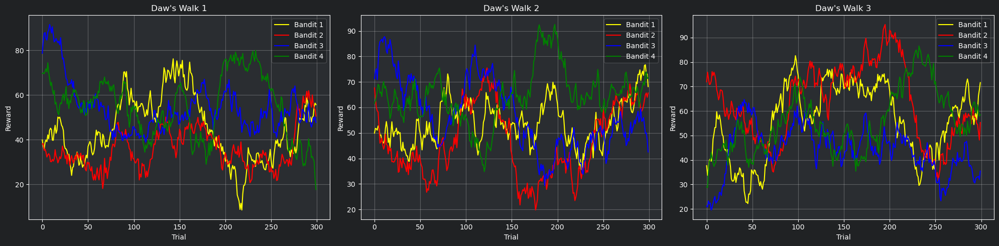

In [ ]:
# & plot daws 
colours = ["yellow", "red", "blue", "green"]
plt.style.use('dark_background')
fig, axes = plt.subplots(1, 3, figsize=(20, 5))
fig.patch.set_facecolor('#202224')  # figure background (dark grey)

for i, ax in enumerate(axes):
    ax.set_facecolor('#2a2d31')    # axes panel background (slightly lighter grey)
    for j in range(4):
        ax.plot(rewards[i, :, j], label=f'Bandit {j+1}', color=colours[j])
    ax.set_title(f'Daw\'s Walk {i+1}')
    ax.set_xlabel('Trial')
    ax.set_ylabel('Reward')
    ax.grid(True, alpha=0.25)
    ax.legend(frameon=True, framealpha=0.2)

plt.tight_layout()
plt.show()

In [17]:
def plot_simulated_plays(sims, params, group):
    # fixed settings for this project
    K, R = 5, 3
    palette = ["#00346B", "#7C3E00", "#A70003", "#00B6A7", "#14AD00"]

    # short names
    sim_smp   = sims[group]['AlphaSMP']              # (nSubjects, K, R, nTrials)
    sim_smep  = sims[group]['AlphaSMEP']
    params_smp  = params[group]['AlphaSMP']['params']
    params_smep = params[group]['AlphaSMEP']['params']

    nSubjects = sim_smp['reward_obt'].shape[0]
    nTrials   = sim_smp['reward_obt'].shape[-1]

    def lighten(color, f):
        r, g, b = to_rgb(color)
        return (r + (1 - r) * f, g + (1 - g) * f, b + (1 - b) * f)

    plt.style.use('dark_background')
    fig, axes = plt.subplots(nSubjects, 2, figsize=(16, 3 * nSubjects), sharex=True, sharey=True)
    fig.patch.set_facecolor('#202224')

    for subject in range(nSubjects):
        ax_smp, ax_smep = axes[subject, 0], axes[subject, 1]

        # ----- AlphaSMP (left) -----
        for d in range(K):
            col    = palette[d]
            alpha  = params_smp['alpha'][subject, d]
            beta   = params_smp['beta'][subject, d]
            persev = params_smp['persev'][subject, d]
            label  = fr"d{d+1}:α={alpha:.3f}, β={beta:.3f}, ρ={persev:.2f}"

            ax_smp.plot(range(1, nTrials + 1), sim_smp['reward_obt'][subject, d, 0, :], color=lighten(col, 0.00), lw=1.25, label=label)
            ax_smp.plot(range(1, nTrials + 1), sim_smp['reward_obt'][subject, d, 1, :], color=lighten(col, 0.35), lw=1.25)
            ax_smp.plot(range(1, nTrials + 1), sim_smp['reward_obt'][subject, d, 2, :], color=lighten(col, 0.65), lw=1.25)

        if subject == 0:
            ax_smp.set_title(f"{group} — AlphaSMP")
        ax_smp.set_ylabel(f"subject {subject+1:02d}")
        if subject == nSubjects - 1:
            ax_smp.set_xlabel("trial")

        # ----- BayesSMEP (right) -----
        for d in range(K):
            col     = palette[d]
            alpha  = params_smp['alpha'][subject, d]
            beta    = params_smep['beta'][subject, d]
            phi     = params_smep['phi'][subject, d]
            persev  = params_smep['persev'][subject, d]
            label   = fr"d{d+1}: α={alpha:.3f}, β={beta:.3f}, φ={phi:.2f}, ρ={persev:.2f}"

            ax_smep.plot(range(1, nTrials + 1), sim_smep['reward_obt'][subject, d, 0, :], color=lighten(col, 0.00), lw=1.25, label=label)
            ax_smep.plot(range(1, nTrials + 1), sim_smep['reward_obt'][subject, d, 1, :], color=lighten(col, 0.35), lw=1.25)
            ax_smep.plot(range(1, nTrials + 1), sim_smep['reward_obt'][subject, d, 2, :], color=lighten(col, 0.65), lw=1.25)

        if subject == 0:
            ax_smep.set_title(f"{group} — AlphaSMEP")
            ax_smp.legend(ncol=1, fontsize=9, frameon=False)
            ax_smep.legend(ncol=1, fontsize=9, frameon=False)
        if subject == nSubjects - 1:
            ax_smep.set_xlabel("trial")

    plt.tight_layout()
    plt.show()

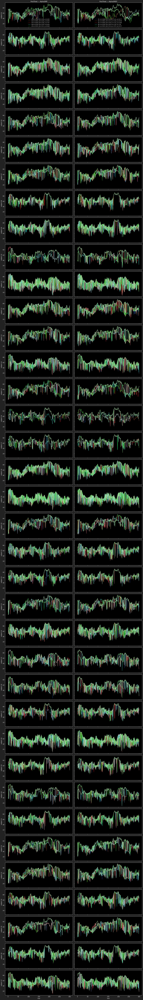

In [19]:
plot_simulated_plays(simulations, parameters_HDI_ranked, 'PostTreat')